In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree 
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from pandas_profiling import ProfileReport

In [2]:
df=pd.read_csv('winequality-red.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
df.shape

(1599, 12)

In [4]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [6]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [7]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [7]:
x = df.drop(columns='quality')

In [8]:
x.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [9]:
y = df['quality']

In [10]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=300)

In [11]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1166,9.9,0.54,0.26,2.00,0.111,7.0,60.0,0.99709,2.94,0.98,10.2
263,7.9,0.37,0.23,1.80,0.077,23.0,49.0,0.99630,3.28,0.67,9.3
34,5.2,0.32,0.25,1.80,0.103,13.0,50.0,0.99570,3.38,0.55,9.2
1148,7.8,0.39,0.42,2.00,0.086,9.0,21.0,0.99526,3.39,0.66,11.6
626,8.8,0.60,0.29,2.20,0.098,5.0,15.0,0.99880,3.36,0.49,9.1
...,...,...,...,...,...,...,...,...,...,...,...
1033,7.5,0.57,0.08,2.60,0.089,14.0,27.0,0.99592,3.30,0.59,10.4
1002,9.1,0.29,0.33,2.05,0.063,13.0,27.0,0.99516,3.26,0.84,11.7
917,6.8,0.41,0.31,8.80,0.084,26.0,45.0,0.99824,3.38,0.64,10.1
481,9.4,0.30,0.56,2.80,0.080,6.0,17.0,0.99640,3.15,0.92,11.7


In [12]:
y_train

1166    5
263     5
34      5
1148    6
626     5
       ..
1033    6
1002    7
917     6
481     8
1233    4
Name: quality, Length: 1279, dtype: int64

In [13]:
dtc = DecisionTreeClassifier()
dtc.fit(x_train,y_train)

DecisionTreeClassifier()

In [14]:
dtc.predict(x_test)

array([6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 4, 5, 6, 7,
       5, 5, 7, 7, 5, 5, 7, 5, 6, 7, 6, 5, 7, 5, 5, 5, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 6, 6, 6, 5, 5, 4, 5, 6, 7, 5, 6, 6, 6, 5, 5, 7, 8, 5,
       7, 5, 4, 6, 5, 6, 6, 7, 6, 6, 8, 5, 6, 5, 5, 6, 6, 7, 7, 7, 5, 5,
       6, 4, 6, 6, 5, 7, 5, 6, 7, 6, 5, 5, 7, 5, 6, 6, 5, 7, 5, 5, 6, 7,
       6, 5, 5, 6, 5, 6, 4, 6, 6, 5, 6, 5, 6, 6, 6, 7, 5, 5, 6, 6, 5, 5,
       5, 5, 6, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 6, 7, 5, 5,
       6, 6, 6, 6, 6, 7, 5, 5, 6, 6, 4, 6, 6, 5, 6, 6, 7, 6, 6, 6, 6, 7,
       6, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 4, 6, 6, 6, 6,
       6, 5, 5, 6, 6, 6, 6, 7, 5, 6, 5, 5, 5, 6, 7, 5, 5, 7, 5, 7, 5, 7,
       5, 5, 5, 5, 6, 7, 5, 5, 5, 5, 5, 6, 5, 7, 6, 5, 6, 5, 6, 6, 5, 6,
       6, 6, 7, 5, 5, 5, 5, 5, 7, 5, 7, 5, 4, 7, 6, 6, 5, 7, 6, 6, 5, 5,
       6, 7, 6, 5, 6, 4, 5, 6, 5, 6, 7, 5, 5, 6, 5, 7, 7, 6, 5, 6, 6, 4,
       5, 5, 6, 5, 5, 5, 6, 4, 7, 6, 6, 7, 5, 6, 5,

In [15]:
dtc.score(x_test,y_test)

0.615625

In [16]:
dt_ent=DecisionTreeClassifier(criterion = 'entropy')

In [17]:
dt_ent.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [18]:
dt_ent.score(x_test,y_test)

0.60625

In [141]:
ouputfile=dot_dt_for_ent = open('dt_ent_meta', 'w')
tree.export_graphviz(dt_ent,out_file=ouputfile, feature_names=x.columns)

In [142]:
dir()

['DecisionTreeClassifier',
 'Dtc',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 'X',
 'X_test',
 'X_train',
 '_',
 '_10',
 '_107',
 '_108',
 '_110',
 '_112',
 '_113',
 '_116',
 '_117',
 '_12',
 '_120',
 '_121',
 '_122',
 '_124',
 '_125',
 '_127',
 '_130',
 '_131',
 '_134',
 '_135',
 '_136',
 '_137',
 '_139',
 '_140',
 '_16',
 '_17',
 '_2',
 '_21',
 '_23',
 '_24',
 '_25',
 '_26',
 '_28',
 '_29',
 '_31',
 '_33',
 '_37',
 '_38',
 '_4',
 '_5',
 '_57',
 '_58',
 '_6',
 '_75',
 '_78',
 '_79',
 '_83',
 '_85',
 '_86',
 '_87',
 '_88',
 '_89',
 '_9',
 '_91',
 '_92',
 '_94',
 '_96',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i100',
 '_i101',
 '_i102',
 '_i103',
 '_i104',
 '_i105',
 '_i106',
 '_i107',
 '_i108',
 '_i109',
 '_i11',
 '_i110',
 '_i111',
 '_i112',
 '_i113',
 '_i114',
 '_i115',
 '_i116',
 '_i117',
 '_i118',
 '_i119',
 '_i12',
 '_i120',
 '_i121',
 '_i122',
 '_i123',
 '_i124',

In [20]:
import matplotlib.pyplot as plt
%matplotlib inline

[Text(588.6588416466346, 1058.5894736842106, 'X[10] <= 10.525\nentropy = 1.694\nsamples = 1279\nvalue = [5, 43, 549, 513, 153, 16]'),
 Text(316.6485126201923, 1001.3684210526317, 'X[9] <= 0.575\nentropy = 1.346\nsamples = 781\nvalue = [3, 27, 463, 262, 25, 1]'),
 Text(120.27403846153847, 944.1473684210526, 'X[2] <= 0.055\nentropy = 1.189\nsamples = 308\nvalue = [3, 17, 221, 63, 4, 0]'),
 Text(52.3125, 886.9263157894737, 'X[10] <= 10.35\nentropy = 1.512\nsamples = 67\nvalue = [2, 8, 45, 8, 4, 0]'),
 Text(40.24038461538462, 829.7052631578947, 'X[1] <= 0.728\nentropy = 1.269\nsamples = 60\nvalue = [2, 6, 45, 5, 2, 0]'),
 Text(26.826923076923077, 772.4842105263158, 'X[4] <= 0.075\nentropy = 0.895\nsamples = 41\nvalue = [0, 1, 34, 4, 2, 0]'),
 Text(14.307692307692308, 715.2631578947369, 'X[0] <= 7.2\nentropy = 1.686\nsamples = 11\nvalue = [0, 1, 6, 2, 2, 0]'),
 Text(7.153846153846154, 658.042105263158, 'X[4] <= 0.073\nentropy = 0.592\nsamples = 7\nvalue = [0, 0, 6, 1, 0, 0]'),
 Text(3.57692

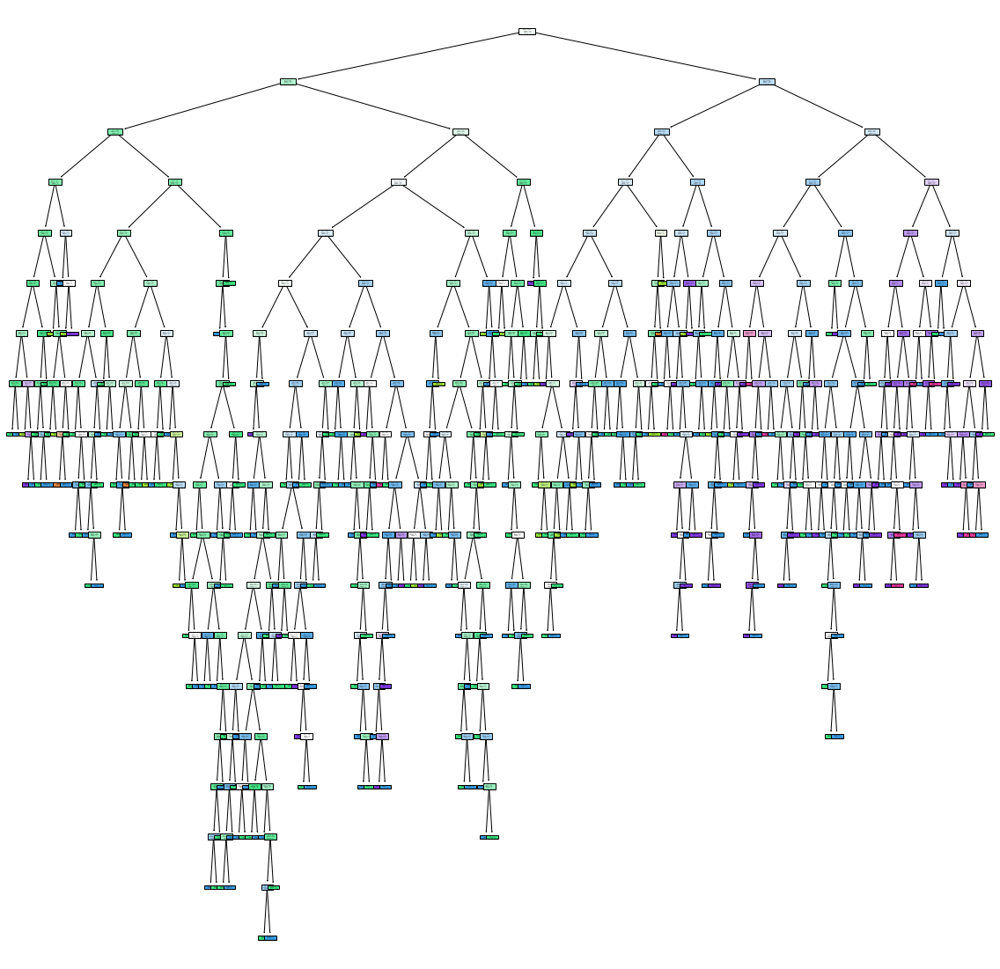

In [21]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_ent, filled=True)

In [20]:
df1 = df.head(500)

In [21]:
x1 = df1.drop(columns='quality')

In [22]:
y1 =df1['quality']

In [23]:
dt1 = DecisionTreeClassifier()

In [24]:
dt1.fit(x1,y1)

DecisionTreeClassifier()

In [25]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [26]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


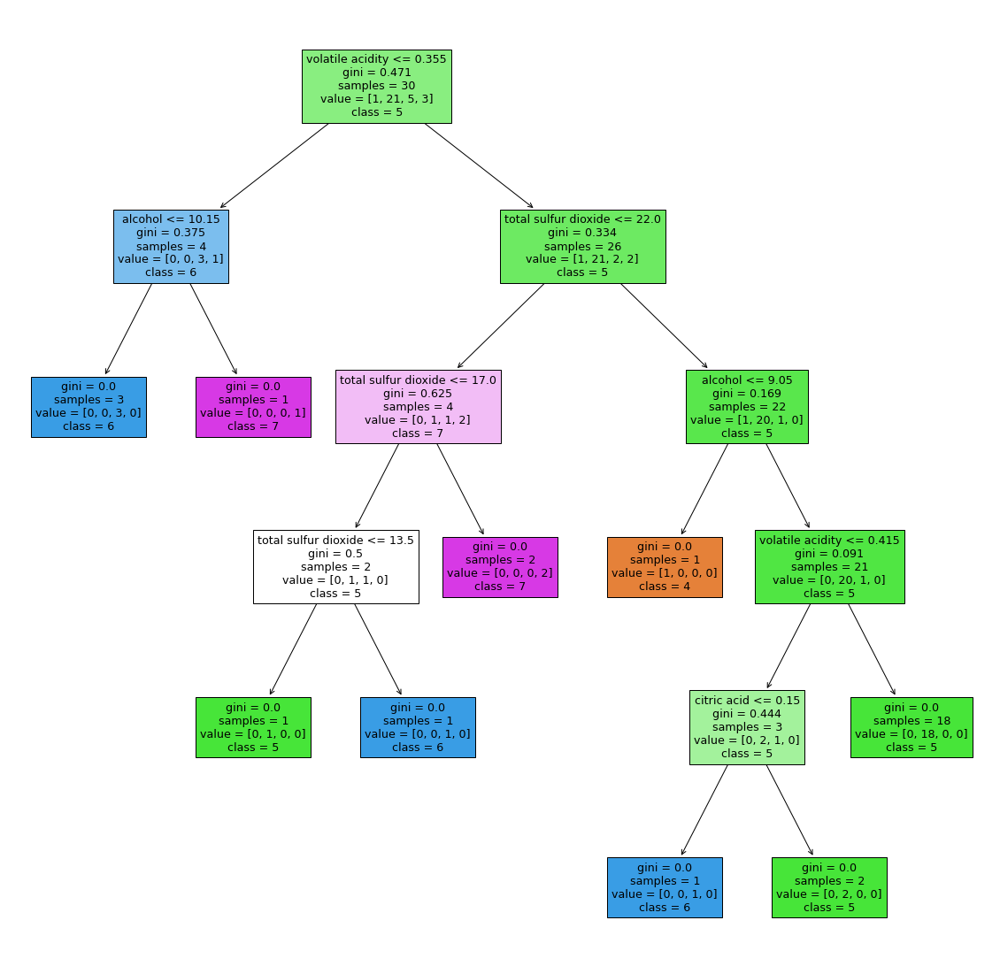

In [58]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt1, filled=True, class_names=[str(i) for i in set(y1)], feature_names=x1.columns)
plt.savefig('dt1_model')

In [30]:
df['volatile acidity'].mean()

0.5278205128205128

In [27]:
dt1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [28]:
dt1.score(x_test,y_test)

0.63125

### Post Pruning

In [29]:
path=dt1.cost_complexity_pruning_path(x1,y1)

In [30]:
path

{'ccp_alphas': array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
        0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.00203333, 0.00247552, 0.00261111,
        0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00272222, 0.00283333, 0.003     , 0.003     , 0.003     ,
        0.003     , 0.00304762, 0.00304762, 0.00305051, 0.00308418,
        0.00328205, 0.00333333, 0.00333333, 0.00334032, 0.00336606,
        0.00342857, 0.00343316, 0.0035    , 0.0035    , 0.0036    ,
        0.00363636, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
        0.00404444, 0.00428571, 0.00428571, 0.00437662, 0.00462338,
        0.00465709, 0.00466667, 0.0048    , 0.00487179, 0.00504242,
        0.00508235, 0.00509091, 0.00510606, 0.00516667, 0.00568485,
        0.00589394, 0.00656364, 0.

In [31]:
ccp_alpha = path['ccp_alphas']

In [69]:
ccp_alpha

array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
       0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.00203333, 0.00247552, 0.00261111, 0.00262769,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00272222, 0.00283333,
       0.003     , 0.003     , 0.003     , 0.003     , 0.00304762,
       0.00305051, 0.00308418, 0.00328205, 0.00333333, 0.00333333,
       0.00334032, 0.00336606, 0.00342857, 0.00343316, 0.0035    ,
       0.0035    , 0.0036    , 0.00363636, 0.00373333, 0.00373809,
       0.0038    , 0.0038237 , 0.004     , 0.00404444, 0.00428571,
       0.00437662, 0.00462338, 0.00465709, 0.00466667, 0.0048    ,
       0.00495726, 0.00504242, 0.00508235, 0.00509091, 0.00510606,
       0.00516667, 0.00568485, 0.00589394, 0.00656364, 0.00671079,
       0.0067591 , 0.00688352, 0.00688889, 0.007     , 0.00701

In [32]:
dt_m = []
for ccp in ccp_alpha:
    dt_m1 = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m1.fit(x1,y1)
    dt_m.append(dt_m1)

In [33]:
dt_m

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.001866666666666667),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0024755244755244737),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alph

In [34]:
train_score = [i.score(x1,y1) for i in dt_m]    
train_score

[1.0,
 0.998,
 0.996,
 0.996,
 0.992,
 0.992,
 0.988,
 0.988,
 0.96,
 0.964,
 0.96,
 0.966,
 0.958,
 0.96,
 0.962,
 0.962,
 0.958,
 0.96,
 0.958,
 0.952,
 0.946,
 0.932,
 0.934,
 0.93,
 0.93,
 0.932,
 0.932,
 0.928,
 0.932,
 0.932,
 0.928,
 0.924,
 0.916,
 0.916,
 0.916,
 0.916,
 0.912,
 0.918,
 0.912,
 0.912,
 0.902,
 0.898,
 0.896,
 0.9,
 0.894,
 0.888,
 0.884,
 0.88,
 0.886,
 0.878,
 0.882,
 0.87,
 0.866,
 0.862,
 0.856,
 0.858,
 0.858,
 0.846,
 0.842,
 0.848,
 0.834,
 0.818,
 0.824,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.558,
 0.478]

In [35]:
test_score = [i.score(x_test,y_test) for i in dt_m]
test_score

[0.596875,
 0.590625,
 0.609375,
 0.6375,
 0.609375,
 0.63125,
 0.6375,
 0.6375,
 0.60625,
 0.590625,
 0.609375,
 0.609375,
 0.615625,
 0.603125,
 0.5875,
 0.609375,
 0.61875,
 0.615625,
 0.60625,
 0.60625,
 0.603125,
 0.615625,
 0.6,
 0.63125,
 0.640625,
 0.621875,
 0.628125,
 0.596875,
 0.625,
 0.628125,
 0.634375,
 0.60625,
 0.590625,
 0.628125,
 0.58125,
 0.603125,
 0.596875,
 0.6125,
 0.5875,
 0.603125,
 0.58125,
 0.575,
 0.596875,
 0.5875,
 0.60625,
 0.5875,
 0.603125,
 0.6,
 0.603125,
 0.59375,
 0.596875,
 0.6125,
 0.6125,
 0.609375,
 0.590625,
 0.609375,
 0.609375,
 0.590625,
 0.59375,
 0.6,
 0.603125,
 0.5875,
 0.596875,
 0.58125,
 0.5875,
 0.59375,
 0.590625,
 0.5875,
 0.578125,
 0.58125,
 0.565625,
 0.559375,
 0.565625,
 0.5625,
 0.565625,
 0.56875,
 0.5625,
 0.55625,
 0.55625,
 0.55625,
 0.546875,
 0.546875,
 0.546875,
 0.54375,
 0.54375,
 0.540625,
 0.540625,
 0.540625,
 0.540625,
 0.540625,
 0.4125]

In [37]:
import matplotlib.pyplot as plt
%matplotlib inline

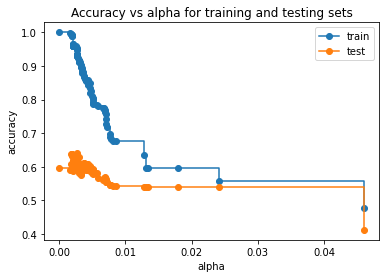

In [38]:
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy vs alpha for training and testing sets')
ax.plot(ccp_alpha,train_score, marker='o', label='train', drawstyle = 'steps-post')
ax.plot(ccp_alpha,test_score, marker='o', label='test', drawstyle = 'steps-post')
ax.legend()
plt.show()

### Building a model again basis on the onservation after post pruning. This time we can use the aplha values between 0.01 to 0.02 as the accuracy of train and test dataset is close to each other


In [39]:
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'alcohol <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'total sulfur dioxide <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'sulphates <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

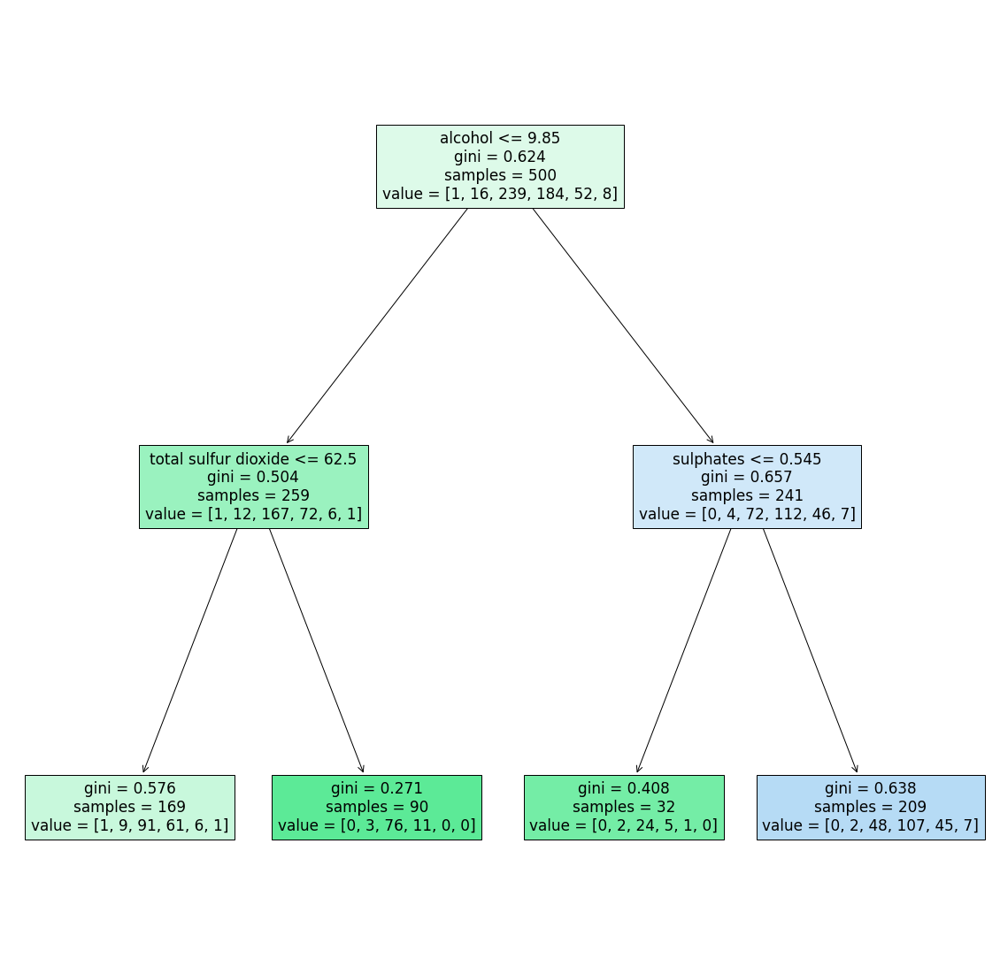

In [40]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp, filled=True, feature_names=x1.columns)

In [41]:
dt_model_ccp.score(x1,y1)

0.596

In [42]:
dt_model_ccp.score(x_test,y_test)

0.540625

Similarly, we can perform the above steps for other parameters given in the alogorith.
We, can also perform random search CV or grid search CV to get the best fit parameters in the algorithm

### GridSearch CV

In [43]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [44]:
grid_param = {'criterion': ['gini', 'entropy'],
             'splitter':['best', 'random'],
             'max_depth':range(2,40,1),
             'min_samples_split':range(2,10,1),
             'min_samples_leaf':range(1,10,1)
             }

In [45]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp, param_grid=grid_param, cv=5, n_jobs=-1)

In [83]:
grid_ccp.fit(x1,y1)

c:\users\rahul.goyal\appdata\local\programs\python\python37\lib\site-packages\sklearn\model_selection\_split.py:680: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  UserWarning,


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [84]:
grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'splitter': 'random'}

In [90]:
dt_ccp_new=DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=2, min_samples_split=2, splitter='random', ccp_alpha=0.014)

In [91]:
dt_ccp_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=15,
                       min_samples_leaf=2, splitter='random')

In [92]:
dt_ccp_new.score(x1,y1)

0.622

In [93]:
dt_ccp_new.score(x_test,y_test)

0.584375

In [95]:
pred = dt_ccp_new.predict(x_train)

In [97]:
confusion_matrix(y_train,pred)

array([[  0,   0,   4,   1,   0,   0],
       [  0,   2,  29,  12,   0,   0],
       [  0,   5, 447,  94,   3,   0],
       [  0,   3, 209, 301,   0,   0],
       [  0,   0,  11, 139,   3,   0],
       [  0,   0,   0,  16,   0,   0]], dtype=int64)

# Random Forest

In [46]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [48]:
x = df.drop(columns=['quality'])

In [49]:
y = df['quality']

In [51]:
from sklearn.ensemble import BaggingClassifier

In [52]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=0)

In [54]:
bag_dt=BaggingClassifier(DecisionTreeClassifier(), n_estimators=10)

In [56]:
bag_dt.fit(x_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [57]:
bag_dt.predict(x_test)

array([5, 5, 7, 5, 5, 6, 6, 6, 5, 5, 5, 5, 6, 4, 5, 7, 7, 6, 5, 6, 6, 5,
       6, 7, 5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 7, 7, 5, 5, 6, 6, 5, 7, 5, 6,
       6, 5, 5, 6, 5, 6, 5, 6, 6, 6, 6, 5, 5, 5, 6, 6, 5, 6, 6, 6, 5, 6,
       5, 5, 7, 6, 6, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 5, 6, 6, 6, 6, 6, 5,
       5, 5, 5, 6, 6, 5, 7, 6, 7, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 7, 5, 6, 6, 5, 6, 6, 6, 5, 4, 5, 5, 6, 6, 5, 5, 6, 6, 6, 6,
       6, 5, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 7, 6, 6, 5, 6, 6, 5, 5,
       6, 6, 6, 6, 6, 7, 5, 6, 7, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 7, 6, 6,
       7, 7, 7, 5, 5, 6, 6, 6, 7, 5, 6, 6, 5, 6, 6, 6, 6, 6, 5, 5, 5, 6,
       6, 5, 5, 6, 6, 6, 6, 6, 5, 7, 7, 6, 6, 6, 5, 7, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 5, 6, 5, 5, 6, 6, 6, 7, 7, 6, 5, 5,
       5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 5, 6, 5, 6, 5, 5, 5, 7, 6, 6, 5, 6,
       6, 5, 5, 5, 6, 6, 5, 5, 5, 5, 6, 6, 7, 6, 7, 6, 5, 7, 5, 5, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6,

In [59]:
bag_dt.base_estimator_

DecisionTreeClassifier()

In [60]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [62]:
from sklearn.neighbors import KNeighborsClassifier

In [63]:
bag_knn = BaggingClassifier(KNeighborsClassifier(6), n_estimators=10)

In [65]:
bag_knn.fit(x_train,y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [67]:
bag_knn.predict(x_test)

array([5, 3, 7, 6, 6, 6, 6, 6, 6, 5, 5, 6, 5, 5, 6, 6, 7, 6, 6, 6, 6, 6,
       6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 5, 6, 7, 7, 5, 6, 6, 6, 6, 7, 6, 5,
       6, 6, 5, 6, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 7, 5, 5, 6, 6, 5, 5, 5,
       5, 7, 7, 7, 5, 5, 6, 5, 6, 6, 5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 7, 6, 5, 6, 5, 6, 5, 6, 6, 5,
       6, 5, 6, 6, 5, 7, 5, 7, 6, 6, 5, 7, 6, 5, 7, 6, 5, 5, 5, 6, 5, 5,
       6, 5, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 6, 7, 6, 6, 5, 5, 6, 6,
       6, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 5, 6, 5, 6, 5, 5, 7, 6, 7, 7, 6,
       7, 7, 7, 5, 5, 6, 6, 6, 7, 5, 6, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 6, 6, 5, 5, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5,
       5, 5, 6, 7, 5, 5, 5, 5, 6, 4, 5, 6, 6, 5, 6, 6, 6, 6, 7, 6, 6, 5,
       6, 6, 5, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 5, 5,
       5, 5, 6, 5, 5, 5, 5, 5, 6, 5, 7, 6, 7, 6, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6,

In [68]:
from sklearn.ensemble import RandomForestClassifier

In [81]:
rf = RandomForestClassifier(n_estimators=5)

In [82]:
rf.fit(x_train,y_train)

RandomForestClassifier(n_estimators=5)

In [83]:
rf.score(x_test,y_test)

0.66

In [77]:
bag_dt.score(x_test,y_test)

0.65

In [78]:
bag_knn.score(x_test,y_test)

0.51

In [84]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=10445241),
 DecisionTreeClassifier(max_features='auto', random_state=468161754),
 DecisionTreeClassifier(max_features='auto', random_state=437796821),
 DecisionTreeClassifier(max_features='auto', random_state=543526539),
 DecisionTreeClassifier(max_features='auto', random_state=1962327747)]

In [85]:
rf.estimators_[0]

DecisionTreeClassifier(max_features='auto', random_state=10445241)

[Text(521.4380223336113, 1067.0666666666666, 'X[10] <= 10.55\ngini = 0.648\nsamples = 757\nvalue = [11, 44, 520, 459, 152, 13]'),
 Text(159.9823211984536, 1026.8, 'X[1] <= 0.317\ngini = 0.537\nsamples = 466\nvalue = [8, 27, 441, 233, 25, 1]'),
 Text(24.36385688295937, 986.5333333333334, 'X[7] <= 0.997\ngini = 0.441\nsamples = 35\nvalue = [0, 0, 10, 38, 5, 0]'),
 Text(10.828380836870831, 946.2666666666667, 'X[8] <= 3.405\ngini = 0.444\nsamples = 4\nvalue = [0, 0, 4, 0, 2, 0]'),
 Text(5.414190418435416, 906.0, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 4, 0, 0, 0]'),
 Text(16.242571255306245, 906.0, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 0, 2, 0]'),
 Text(37.89933292904791, 946.2666666666667, 'X[10] <= 9.25\ngini = 0.326\nsamples = 31\nvalue = [0, 0, 6, 38, 3, 0]'),
 Text(27.07095209217708, 906.0, 'X[3] <= 2.3\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 4, 2, 0, 0]'),
 Text(21.656761673741663, 865.7333333333333, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 2, 0, 0]'),
 Text(32.485142510

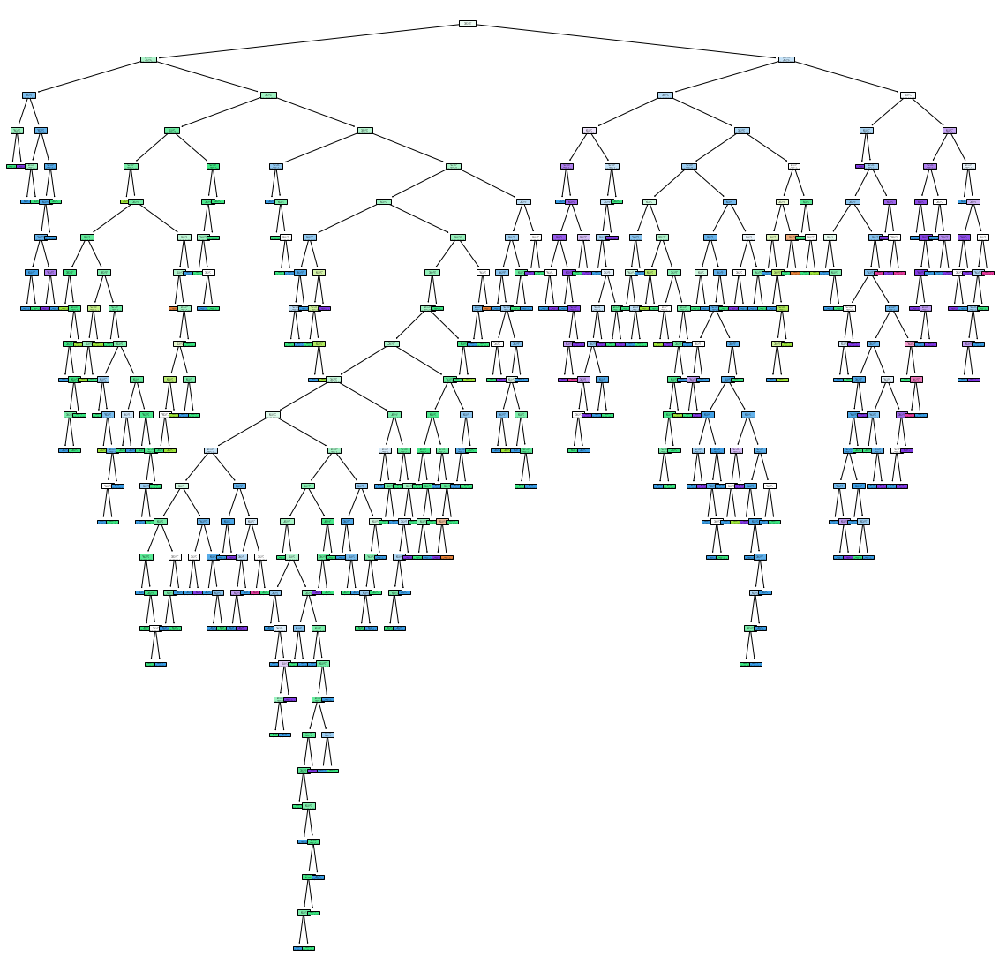

In [86]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf.estimators_[0], filled=True)

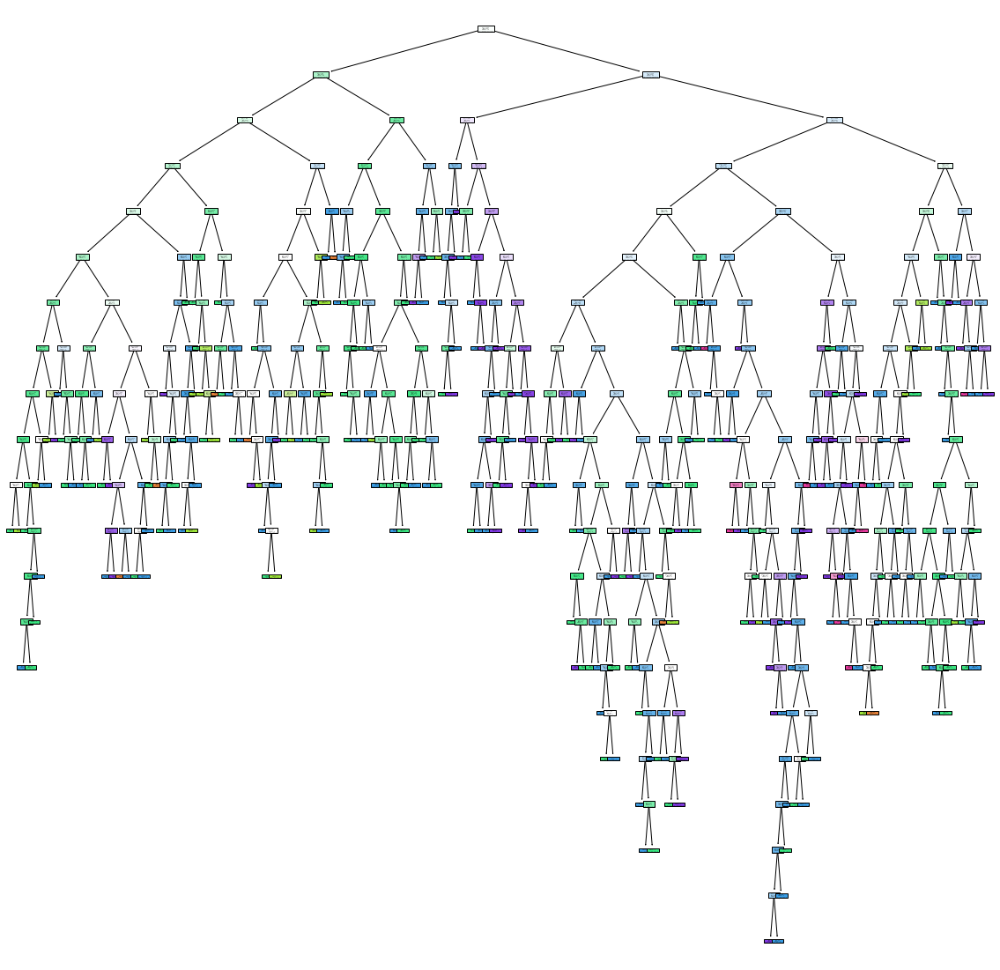

In [87]:
plt.figure(figsize=(20,20))
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i], filled = True)

In [98]:
grid_param = {'n_estimators':[5,10,50,100],
             'criterion': ['gini', 'entropy'],
             'max_depth': range(10),
             'min_samples_leaf': range(10)}

In [99]:
rf = RandomForestClassifier(n_estimators = 5)

In [100]:
grid_search_rf=GridSearchCV(estimator=rf, param_grid=grid_param, cv=10, n_jobs=-1, verbose=1)

In [101]:
grid_search_rf.fit(x_train,y_train)

Fitting 10 folds for each of 800 candidates, totalling 8000 fits


c:\users\rahul.goyal\appdata\local\programs\python\python37\lib\site-packages\sklearn\model_selection\_split.py:680: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  UserWarning,
c:\users\rahul.goyal\appdata\local\programs\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
1520 fits failed out of a total of 8000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
800 fits failed with the following error:
Traceback (most recent call last):
  File "c:\users\rahul.goyal\appdata\local\programs\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File 

GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=5), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100]},
             verbose=1)

In [102]:
grid_search_rf.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 2,
 'n_estimators': 100}

In [104]:
rf_new=RandomForestClassifier(criterion='entropy', max_depth=9, min_samples_leaf=2, n_estimators=100)

In [105]:
rf_new.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, min_samples_leaf=2)

In [106]:
rf_new.score(x_test,y_test)

0.655